In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

retail_sample1 = r"C:\Users\nonox\retail_sample1.csv"
retail_sample1 = retail_sample1.replace("\\", "/")
retail_sample1 = pd.read_csv(retail_sample1)
print(retail_sample1)

       Invoice StockCode                        Description  Quantity  \
0       489439     22065     CHRISTMAS PUDDING TRINKET POT         12   
1       489439     22138      BAKING SET 9 PIECE RETROSPOT          9   
2       489439     22139  RETRO SPOT TEA SET CERAMIC 11 PC          9   
3       489439     22352   LUNCHBOX WITH CUTLERY RETROSPOT         12   
4       489439    85014A   BLACK/BLUE DOTS RUFFLED UMBRELLA         3   
...        ...       ...                                ...       ...   
79986   538156     22077             6 RIBBONS RUSTIC CHARM         6   
79987   538156     22961             JAM MAKING SET PRINTED         1   
79988   538156     22113        GREY HEART HOT WATER BOTTLE         6   
79989   538156     22141     CHRISTMAS CRAFT TREE TOP ANGEL         3   
79990   538165     22659            LUNCH BOX I LOVE LONDON        10   

               InvoiceDate  Price  CustomerID         Country  
0      2009-12-01 09:28:00   1.45     12682.0          Fran

# Step 2: Application of mlxtend

In [2]:

# Grouping by Invoice first to create a separate group for each invoice. Then, within each invoice group, it groups by Stockcode. 
basket = (retail_sample1.groupby(['Invoice', 'Description'])['Quantity'] # Quantity.sum() sum the quantity for each StockCode.
         .sum().unstack().reset_index().set_index('Invoice')) # transform each unique StockCode into a separate column.
basket_encoded = basket.applymap(lambda x: 1 if x>0 else 0)
print(basket_encoded)

Description    DOORMAT UNION JACK GUNS AND ROSES   3 STRIPEY MICE FELTCRAFT  \
Invoice                                                                       
489439                                         0                          0   
489440                                         0                          0   
489441                                         0                          0   
489442                                         0                          0   
489514                                         0                          0   
...                                          ...                        ...   
538097                                         0                          0   
538117                                         0                          0   
538151                                         0                          0   
538156                                         0                          0   
538165                                         0    

### 2.1 Appliying the Apriori algorithm

In [3]:
from mlxtend.frequent_patterns import apriori, association_rules

frequent_items = apriori(basket_encoded, min_support=0.03, use_colnames=True)
# Use apriori algorithm to find frequent items bought together. 
# min_support: is a threshold representing how frequently items arebought together, common starting point is 0.01 (1%)
print(frequent_items)

     support                                           itemsets
0   0.038692                           (6 RIBBONS RUSTIC CHARM)
1   0.054353                    (ASSORTED COLOUR BIRD ORNAMENT)
2   0.047674                    (BAKING SET 9 PIECE RETROSPOT )
3   0.043989                       (CHOCOLATE HOT WATER BOTTLE)
4   0.037771                       (COOK WITH WINE METAL SIGN )
..       ...                                                ...
58  0.041916                (WOOD S/3 CABINET ANT WHITE FINISH)
59  0.052741                      (WOODEN FRAME ANTIQUE WHITE )
60  0.043759                (WOODEN PICTURE FRAME WHITE FINISH)
61  0.039613                      (ZINC METAL HEART DECORATION)
62  0.033855  (RED HANGING HEART T-LIGHT HOLDER, WHITE HANGI...

[63 rows x 2 columns]


C:\Users\nonox\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [4]:
rules = association_rules(frequent_items, metric="confidence", min_threshold=0.5)
print(rules)


                          antecedents                           consequents  \
0  (RED HANGING HEART T-LIGHT HOLDER)  (WHITE HANGING HEART T-LIGHT HOLDER)   

   antecedent support  consequent support   support  confidence      lift  \
0            0.049516            0.143252  0.033855    0.683721  4.772856   

   leverage  conviction  zhangs_metric  
0  0.026762    2.708836       0.831663  


In [5]:
# Resources: 
# https://gist.github.com/chaitanyarahalkar/23f1567563b0177bd876f629291cfad9
# https://towardsdatascience.com/apriori-association-rule-mining-explanation-and-python-implementation-290b42afdfc6

In [6]:
##################################################################################

In [7]:
import pandas as pd

# Convert to datetime if not already
retail_sample1['InvoiceDate'] = pd.to_datetime(retail_sample1['InvoiceDate'])

# Extracting time components
retail_sample1['Hour'] = retail_sample1['InvoiceDate'].dt.hour
retail_sample1['DayOfWeek'] = retail_sample1['InvoiceDate'].dt.day_name()
retail_sample1['Month'] = retail_sample1['InvoiceDate'].dt.month


In [8]:
print(retail_sample1.columns)

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'CustomerID', 'Country', 'Hour', 'DayOfWeek', 'Month'],
      dtype='object')


In [9]:
# Example for grouping by Country
retail_sample1.groupby('CustomerID').agg(Frequent_Buyer=('Invoice', 'nunique')).max()

Frequent_Buyer    35
dtype: int64

In [10]:
retail_sample1.groupby('Country').agg(Most_Common_Item=('Description', lambda x: x.mode()[0]))


,Most_Common_Item
Country,
Australia,DOOR MAT UNION FLAG
Austria,RED SPOTTY CUP
Bahrain,CERAMIC CAKE BOWL + HANGING CAKES
Belgium,PLASTERS IN TIN SPACEBOY
Brazil,DOVE DECORATION PAINTED ZINC
Canada,36 PENCILS TUBE RED RETROSPOT
Channel Islands,HOME BUILDING BLOCK WORD
Cyprus,DOOR MAT WELCOME PUPPIES
Denmark,BINGO SET


In [11]:
retail_sample1.groupby('Country').agg(Total_Sales=('Price', 'sum'))


,Total_Sales
Country,
Australia,271.62
Austria,160.95
Bahrain,37.94
Belgium,323.59
Brazil,113.08
Canada,141.22
Channel Islands,404.38
Cyprus,692.02
Denmark,168.20


In [12]:
purchases_per_hour = retail_sample1.groupby('Hour').agg(NumberOfPurchases=('Invoice', 'nunique'))


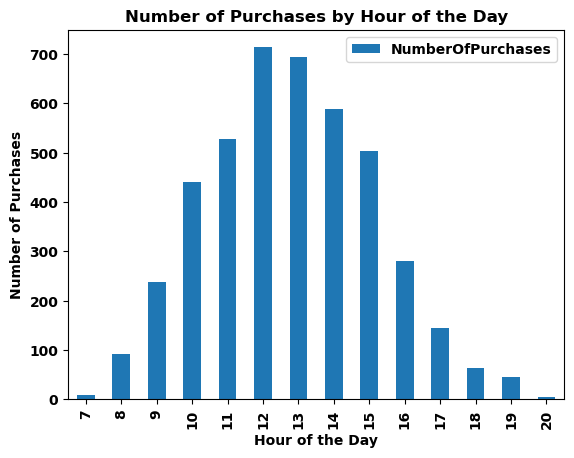

In [13]:
import matplotlib.pyplot as plt

purchases_per_hour.plot(kind='bar')
plt.title('Number of Purchases by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Purchases')
plt.show()


In [14]:
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#

In [15]:
# Group by CustomerID and count the number of unique invoices for each customer
repeat_purchases = retail_sample1.groupby('CustomerID').agg(
    total_invoices=('Invoice', 'nunique')
)

# Add a new column to indicate whether the customer is a repeat purchaser (1 if true, 0 if false)
repeat_purchases['is_repeat_purchaser'] = (repeat_purchases['total_invoices'] > 1).astype(int)

# Calculate the repeat purchase rate
repeat_purchase_rate = repeat_purchases['is_repeat_purchaser'].mean()
print(repeat_purchases.max())

total_invoices         35
is_repeat_purchaser     1
dtype: int64


In [16]:
purchases_by_type = retail_sample1[retail_sample1['Quantity'] > 0].groupby(['CustomerID', 'Description']).agg(
    Total_Purchased=('Quantity', 'sum'))


In [17]:
##################

In [18]:
#### Is there any link between the types of products that clients buy and the fact that customer repeat purchases?

In [19]:
# Assuming 'CustomerID' and 'Invoice' are your column names
customers = retail_sample1.groupby('CustomerID').agg(
    total_invoices=('Invoice', 'nunique')
)
customers['is_repeat_purchaser'] = (customers['total_invoices'] > 1)


In [20]:
# This assumes a 'ProductType' column to categorize items
purchases_by_type = retail_sample1.groupby(['CustomerID', 'Description']).agg(
    total_quantity=('Quantity', 'mean')
).reset_index()


In [21]:
# Merge to get a DataFrame that includes whether each customer is a repeat purchaser
merged_data = purchases_by_type.merge(customers['is_repeat_purchaser'], on='CustomerID')


In [22]:
# Analyze the average quantity of product types bought by repeat versus one-time customers
purchases_by_type = merged_data.groupby(['Description', 'is_repeat_purchaser']).agg(
    average_quantity=('total_quantity', 'mean')
).unstack()


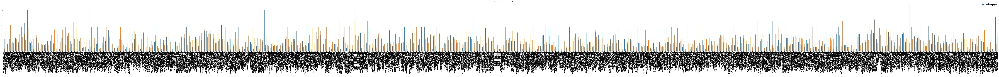

In [23]:
# Visualization example using a bar chart
purchases_by_type.plot(kind='bar', figsize=(200, 10))


plt.title('Product Type Purchased by Customer Type')
plt.xlabel('Product Type')
plt.ylabel('Average Quantity Purchased')
plt.xticks(rotation=90)  # Or any other angle that works
plt.show()

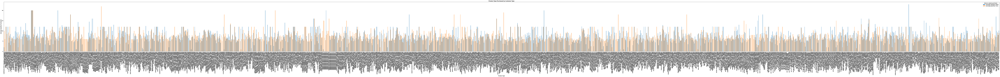

In [24]:
# First, determine repeat purchasers in the original dataset
customer_purchases = retail_sample1.groupby('CustomerID').agg(
    total_invoices=('Invoice', 'nunique')
)
customer_purchases['is_repeat_purchaser'] = (customer_purchases['total_invoices'] > 1)

# Calculate the mean quantity sold per product type
mean_quantity_sold = retail_sample1.groupby('Description')['Quantity'].mean()

# Now filter for products with a total quantity above the mean
popular_products = retail_sample1[retail_sample1['Description'].isin(mean_quantity_sold[mean_quantity_sold > mean_quantity_sold.mean()].index)]

# Merge the repeat purchaser information back into the popular_products DataFrame
popular_products = popular_products.merge(customer_purchases['is_repeat_purchaser'], on='CustomerID')

# Now you can group by 'Description' and 'is_repeat_purchaser'
filtered_product_comparison = popular_products.groupby(['Description', 'is_repeat_purchaser']).agg(
    average_quantity=('Quantity', 'mean')
).unstack()



# Visualization example using a bar chart
filtered_product_comparison.plot(kind='bar', figsize=(200, 10))


plt.title('Product Type Purchased by Customer Type')
plt.xlabel('Product Type')
plt.ylabel('Average Quantity Purchased')
plt.xticks(rotation=90)  # Or any other angle that works
plt.show()

In [25]:
#################################################################

In [26]:
# Group by CustomerID and count the number of unique Invoice numbers
total_purchases_by_customer = retail_sample1.groupby('CustomerID')['Invoice'].nunique()

# Convert the series to a DataFrame
total_purchases_by_customer_df = total_purchases_by_customer.reset_index(name='Total_Purchases')


In [27]:
# To calculate the total spend for each customer, we'll multiply the Quantity by the Price for each row
# and then group by CustomerID and sum these values

# First, create a new column for total spend per row
retail_sample1['Total_Spend'] = retail_sample1['Quantity'] * retail_sample1['Price']

# Now, group by CustomerID and sum the Total_Spend to get the total spend per customer
total_spend_by_customer = retail_sample1.groupby('CustomerID')['Total_Spend'].sum()

# Convert the series to a DataFrame
total_spend_by_customer_df = total_spend_by_customer.reset_index(name='Total_Spend')

# Display the new DataFrame
total_spend_by_customer_df.head()


,CustomerID,Total_Spend
0,12346.0,170.36
1,12352.0,157.30
2,12353.0,307.68
3,12359.0,658.88
4,12368.0,250.30


In [28]:
# To calculate the average spend per purchase for each customer, we'll use the total spend and total purchases
# we calculated previously. We simply divide the total spend by the total number of purchases for each customer.

# Merge the total spend and total purchases DataFrames on CustomerID
customer_spend_purchases_df = total_purchases_by_customer_df.merge(total_spend_by_customer_df, on='CustomerID')

# Calculate average spend per purchase
customer_spend_purchases_df['Average_Spend_Per_Purchase'] = customer_spend_purchases_df['Total_Spend'] / customer_spend_purchases_df['Total_Purchases']

# Display the new DataFrame with the average spend per purchase
customer_spend_purchases_df.head()


,CustomerID,Total_Purchases,Total_Spend,Average_Spend_Per_Purchase
0,12346.0,3,170.36,56.786667
1,12352.0,1,157.30,157.300000
2,12353.0,1,307.68,307.680000
3,12359.0,2,658.88,329.440000
4,12368.0,1,250.30,250.300000


In [29]:
# To calculate product variety, we'll count the number of unique StockCodes (product identifiers) per customer.

# Group by CustomerID and count the number of unique StockCodes
product_variety_by_customer = retail_sample1.groupby('CustomerID')['StockCode'].nunique()

# Convert the series to a DataFrame
product_variety_by_customer_df = product_variety_by_customer.reset_index(name='Product_Variety')

# Merge the product variety DataFrame with the customer spend and purchases DataFrame
customer_features_df = customer_spend_purchases_df.merge(product_variety_by_customer_df, on='CustomerID')

# Display the new DataFrame with the product variety
customer_features_df.head()


,CustomerID,Total_Purchases,Total_Spend,Average_Spend_Per_Purchase,Product_Variety
0,12346.0,3,170.36,56.786667,25
1,12352.0,1,157.30,157.300000,10
2,12353.0,1,307.68,307.680000,18
3,12359.0,2,658.88,329.440000,39
4,12368.0,1,250.30,250.300000,7


In [36]:
# To determine if a customer is a repeat purchaser, we will check if the total number of purchases is greater than 1.
# We will create a binary variable where 1 indicates a repeat purchaser and 0 indicates a one-time purchaser.

# Add 'is_repeat_purchaser' column to the DataFrame
customer_features_df['Is_Repeat_Purchaser'] = (customer_features_df['Total_Purchases'] > 1).astype(int)

# Display the updated DataFrame with the 'is_repeat_purchaser' column
print(customer_features_df)


      CustomerID  Total_Purchases  Total_Spend  Average_Spend_Per_Purchase  \
0        12346.0                3       170.36                   56.786667   
1        12352.0                1       157.30                  157.300000   
2        12353.0                1       307.68                  307.680000   
3        12359.0                2       658.88                  329.440000   
4        12368.0                1       250.30                  250.300000   
...          ...              ...          ...                         ...   
2217     18275.0                1       126.40                  126.400000   
2218     18276.0                1       152.50                  152.500000   
2219     18283.0                3       296.70                   98.900000   
2220     18286.0                1       704.49                  704.490000   
2221     18287.0                2       944.02                  472.010000   

      Product_Variety  Is_Repeat_Purchaser  
0                 

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Correct the column names
X = customer_features_df[['Total_Purchases', 'Total_Spend', 'Average_Spend_Per_Purchase', 'Product_Variety']]  # Features
y = customer_features_df['Is_Repeat_Purchaser']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the feature data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[266   0]
 [  0 179]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       266
           1       1.00      1.00      1.00       179

    accuracy                           1.00       445
   macro avg       1.00      1.00      1.00       445
weighted avg       1.00      1.00      1.00       445



In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Example features and target
X = customer_features_df[['total_purchases', 'total_spend', 'average_spend_per_purchase', 'product_variety']]  # Features
y = customer_features_df['is_repeat_purchaser']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the feature data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


KeyError: "None of [Index(['total_purchases', 'total_spend', 'average_spend_per_purchase',\n       'product_variety'],\n      dtype='object')] are in the [columns]"